# Running the HERA through firstcal: 2457663

This set corresponds to a JD of 2457663. The data can be found on folio at /data4/paper/HERA2015/24576633/\* or via the librarian interface. Instructions for the librarian on folio can be found at http://herawiki.berkeley.edu/doku.php/librarian?s[]=librarian. 

In [4]:
import numpy as np, capo.omni as omni, sys, optparse, glob, capo, aipy as a#, pandas as pd
%matplotlib inline
import matplotlib.pyplot as p
import seaborn as sns
sns.set_context('poster')
sns.set_style('darkgrid') 
p.rcParams['figure.figsize'] = 12, 8
#import mpld3
#mpld3.enable_notebook()


colors = ["#006BA4", "#FF7F0E", "#2CA02C", "#D61D28", "#9467BD", "#8C564B", "#E377C2", "#7F7F7F", "#BCBD22", "#17BECF"]
symbols = ["o", "v", "^", "<", ">", "*"]

/usr/local/lib/python2.7/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)


# Firstcal delay solutions

In [4]:
def load_dmv(filestring, offsets=False, verbose=False):
    files = glob.glob('/Users/sherlock/projects/hera/data/%s'%filestring)
    delays = {}
    means = {}
    medians = {}
    vars = {}
    if offsets: ss = 'o'
    else: ss = 'd'
    for f in files:
        if verbose:
            print 'Reading %s'%f    
        npz = np.load(f)
        for key in npz.files:
            if key.startswith(ss):
                if key not in delays.keys(): 
                    delays[key] = npz[key]
                    continue 
                delays[key] = np.hstack((delays[key],npz[key]))
    
    for k in delays.keys():
        delays[k] = np.array(delays[k]).flatten()
        means[k] = np.mean(delays[k])
        medians[k] = np.median(delays[k])
        vars[k] = np.var(delays[k])
        
    return delays,means,medians,vars
    

delays, means, medians, vars = load_dmv('2457663/zen.2457663.*HH*.uvc.fc.npz',offsets=False)

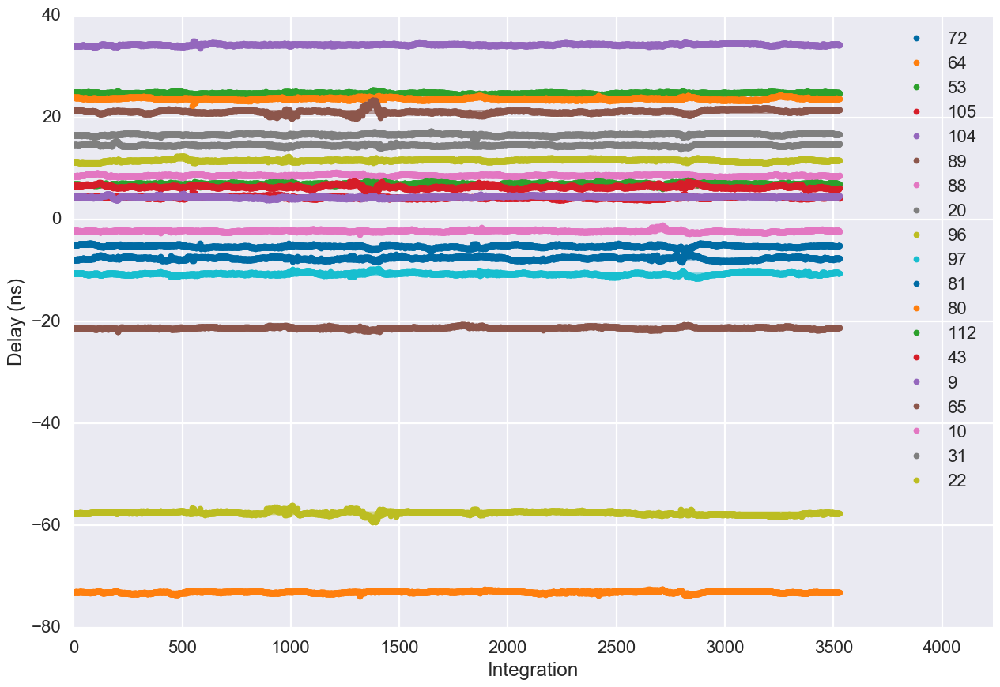

In [5]:
fig = p.figure(figsize=(15,10))
p.subplot(111)

for i,k in enumerate(delays.keys()):
    p.plot(delays[k],'.', color=colors[i%10], label=k[1:])
    p.fill_between(np.arange(delays[k].size), means[k] - vars[k]**.5, means[k] + vars[k]**.5, alpha=.5, color=colors[i%10])
p.xlabel('Integration')    
p.ylabel('Delay (ns)')
p.xlim(0,delays[k].size + delays[k].size*.2)
p.legend()

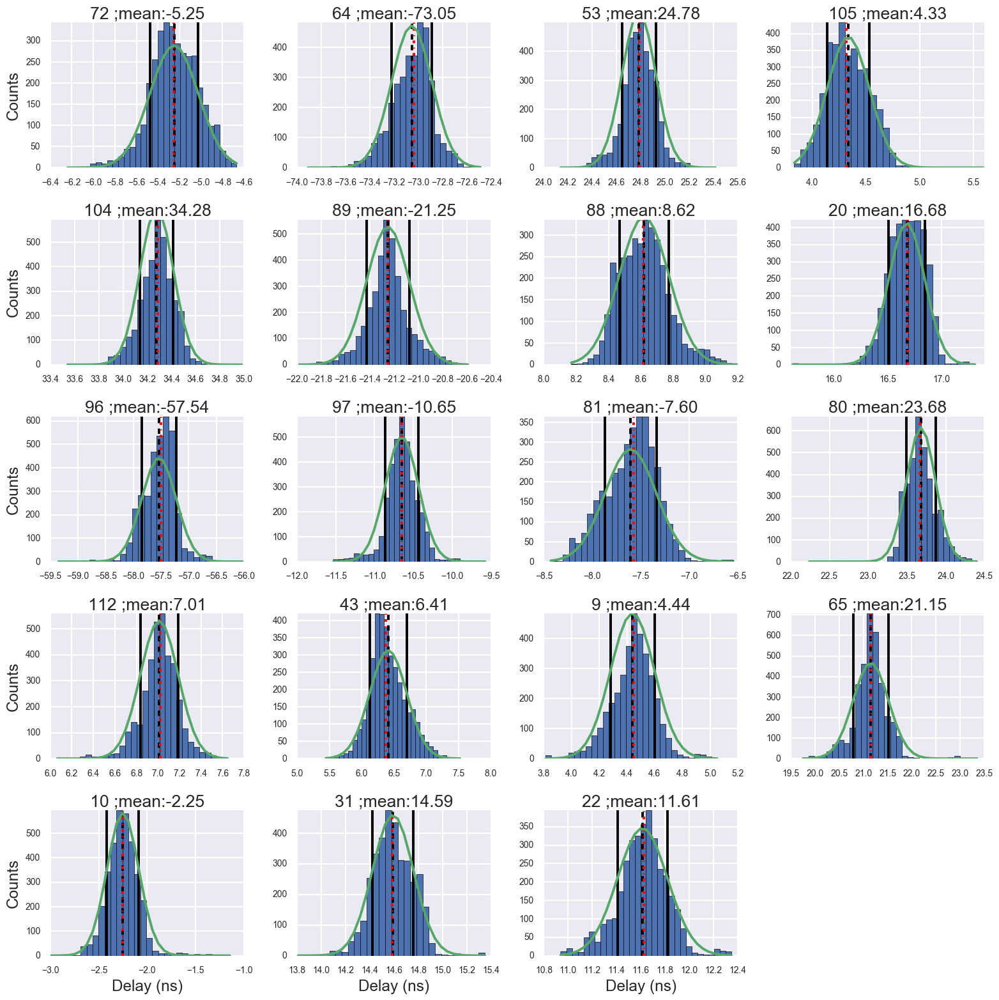

In [8]:
#df = pd.DataFrame(delays)
def gaussian(x,mu,std,scale):
    return scale/np.sqrt(np.pi*2*std) * np.exp(-.5*(x-mu)**2/(std**2))
    
nants = len(delays.keys())
nc = 4
nr = int(divmod(nants,nc)[0] + np.ceil(divmod(nants,nc)[1]/float(nc)))
p.figure(figsize=(16,16))
for i,k in enumerate(delays.keys()):
    p.subplot(nr,nc,i+1)
    h = p.hist(delays[k], bins=30)
    p.tick_params(labelsize=10)
    p.title(k[1:] + ' ;mean:%1.2f'%means[k])
    p.grid(1)
    mx = np.max(h[0])
    p.plot(h[1],gaussian(h[1],means[k],vars[k]**.5,scale=mx))
    p.vlines(means[k], 0, mx, linestyle='--')
    p.vlines(medians[k],0,mx, linestyle='-.', color='red')
    p.vlines(means[k]-np.sqrt(vars[k]),0,mx)
    p.vlines(means[k]+np.sqrt(vars[k]),0,mx)
    p.ylim(0,mx)
    if divmod(i,nc)[-1] == 0:  p.ylabel('Counts')
    if divmod(i,nc)[0] == nr-1:  p.xlabel('Delay (ns)')
p.tight_layout(pad=1.0)
#p.subplots_adjust(wspace=.5,hspace=.6)
    

Above are the delay solutions as a function of integration for a night of data. Plotted in dots are the delay solution/integeration and plotted under them are the mean 1-standard dev errors.  Basically all of the antennas are fairly stable as a function of time. Things check out on that front.

Additionally, the histograms for the delay solutions for each antenna are also shown directly above. Overplotted are the mean value (dashed line), median value (red dashed line), mean $\pm$ 1-standard deviation(solid lines) and a gaussian curve with the same mean and standard deviation as the the delay solutions. The amplitude is given by the maximum value of the histogram.   These histograms show tight delay solutions. However, there are outliers and the solutions are not completely described by a gaussian. That is, this variation is not due to thermal (random) noise. What could be causing the outliers?

There are some distributions that look almost multimodal. e.g. antenna 31. What causes this multimodal distribution? Is it time dependent? etc..



What happens when we apply the solutions to the visibilities? Are we redundant? Why or why not? How far off are we?

$\bf{NOTE}$: Offsets are not solved for in this firstcal run. Offsets should be zero to begin with. 


# Rewriting solutions

We could apply the solutions on a time by time basis, but since the solutions are pretty stable versus time with only a ~nanosecond variation over the whole day on each antenna, it is reasonable to just take the mean or the median. As seen from above, the mean and the median are pretty close for all the antennas and so we opt to use the median soltuion. Using one number for the entire day is going to minimizing introducing time dependent structure into the calibrated visibilities. Lets see how we fare... 

First we need to write out new gain solutions and apply them.



In [9]:
do = {}
for ant in medians.keys():
    ant = ant[1:]
    do[int(ant)] = [medians['d'+ant]]
fqs = np.linspace(.1,.2,1024)

for f in glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.*HH*.uvc.fc.npz'):
    fname = '.'.join(f.split('.')[:-2] + ['median'])
    capo.omni.save_gains_fc(do,fqs,'x',fname)
    

Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.16693.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.17389.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.18085.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.18781.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.19477.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.20173.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.20869.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.21565.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.22261.xx.HH.uvc.median.fc.npz
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.

In [20]:
#plotting with the actual redundant baselines. 
aa = a.cal.get_aa('hsa7458_v000', np.array([.150]))
info = omni.aa_to_info(aa, fcal=True)
#list of redundant antennas to look at 
antstrs = []
for k in info.get_reds(): antstrs.append(capo.zsa.list2str(k))
#antstrs
#Show the antenna strings for different groups of redundant baselines. This just helps us in getting data out etc. 

Loading FirstCalRedundantInfo class


# Applying Firstcal delays to Visibilites
### Baselines in each redundant group.
     '31_97,53_112,64_72,96_10,80_22,104_81',
     '72_80,97_96,112_104',
     '88_97,80_43,64_10',
     '22_112,81_97,9_22,20_81,31_89,88_105,104_31,80_53,96_65,105_72,64_9,89_10,53_20,65_43',
     '10_88,43_64',
     '31_72,65_112,104_105,96_22',
     '10_20,20_64,22_88,31_80,65_104,81_9,43_31,89_53,97_22,112_105',
     '43_104,10_53,81_64,97_9,89_80,112_88',
     '9_65,22_43,64_96,88_31,105_89,72_10',
     '65_105,43_72,96_88',
     '10_104,97_53,112_64,81_80',
     '43_53,81_88,65_80,97_105,10_9,89_64',
     '9_31,20_65,22_89,53_96,64_104,72_81,105_20,81_43,88_53,112_10',
     '10_105,43_9,65_64,89_88',
     '31_81,64_105,9_72,20_112,89_97,80_9,104_20,96_89,65_10,53_22',
     '9_88,10_81,22_105,31_53,43_89,53_64,96_104,97_112,20_9,89_20,81_22,65_31,112_72,104_80',
     '22_104,81_96,112_31,72_53,97_65,105_80',
     '96_112,104_72',
     '9_105,20_22,64_88,65_89,10_97,22_72,81_112,96_31,104_53,80_64,53_9,43_10,31_20,89_81',
     '53_105,65_81,20_72,43_97,80_88,89_112,104_9,96_20,31_22',
     '9_112,20_97,53_81,80_20,96_43,88_72,104_89,31_10,64_22',
     '10_80,97_64',
     '10_22,20_88,31_64,81_105,89_9,43_20,65_53,97_72,96_80',
     '80_112,104_97',
     '31_105,43_112,96_9,89_72,104_88,65_22',
     '65_72,96_105',
     '43_105,65_88'

In [11]:
#apply solutions 
!cd ../2457663; ~/src/capo/omni/omni_apply.py  -p xx --omnipath="%s.HH.uvc.median.fc.npz" zen.2457663.5*xx.HH.uvc --firstcal

   Omnical npz: zen.2457663.50098.xx.HH.uvc.median.fc.npz
Reading zen.2457663.50098.xx.HH.uvc
    Calibrating
    Saving zen.2457663.50098.xx.HH.uvcF
   Omnical npz: zen.2457663.50794.xx.HH.uvc.median.fc.npz
Reading zen.2457663.50794.xx.HH.uvc
    Calibrating
    Saving zen.2457663.50794.xx.HH.uvcF
   Omnical npz: zen.2457663.51490.xx.HH.uvc.median.fc.npz
Reading zen.2457663.51490.xx.HH.uvc
    Calibrating
    Saving zen.2457663.51490.xx.HH.uvcF
   Omnical npz: zen.2457663.52186.xx.HH.uvc.median.fc.npz
Reading zen.2457663.52186.xx.HH.uvc
    Calibrating
    Saving zen.2457663.52186.xx.HH.uvcF
   Omnical npz: zen.2457663.52882.xx.HH.uvc.median.fc.npz
Reading zen.2457663.52882.xx.HH.uvc
    Calibrating
    Saving zen.2457663.52882.xx.HH.uvcF
   Omnical npz: zen.2457663.53578.xx.HH.uvc.median.fc.npz
Reading zen.2457663.53578.xx.HH.uvc
    Calibrating
    Saving zen.2457663.53578.xx.HH.uvcF
   Omnical npz: zen.2457663.54274.xx.HH.uvc.median.fc.npz
Reading zen.2457663.54274.xx.HH.uvc
    Ca

In [13]:
def order_data(dd, info):
    d = {}
    pol = dd[dd.keys()[0]].keys()[0]
    for bl in dd.keys():
        if bl in info.bl_order(): 
            d[bl] = {}
            d[bl][pol] = dd[bl][pol]
        else:
            d[bl[::-1]] = {}
            d[bl[::-1]][pol] = np.conj(dd[bl][pol])
    return d

In [14]:
#antstr = '31_105,43_112,96_9,89_72,104_88,65_22'
antstr = '9_88,10_81,22_105,31_53,43_89,53_64,96_104,97_112,20_9,89_20,81_22,65_31,112_72,104_80'
#antstr = '9_105,20_22,64_88,65_89,10_97,22_72,96_31,104_53,80_64,53_9,43_10,31_20'
#antstr = '22_112,9_22,31_89,88_105,104_31,80_53,96_65,105_72,64_9,89_10,53_20,65_43'
#antstr = '9_88,22_105,31_53,43_89,53_64,96_104,10_81'
#antstr = '9_105,20_22,64_88,65_89,10_97,43_10,81_112'
#antstr = '81_97,104_31,80_53,96_65,89_10,65_43'
#,97_112,20_9,89_20,65_31,112_72,104_80'
#antstr = '97_112,20_9,89_20,65_31,112_72,104_80'
pol='xx'
pmeta, pdata, pflags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.5*xx.HH.uvc'), antstr, pol)
fmeta, fdata, fflags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.5*xx.HH.uvcF'), antstr, pol)
#Conjugates data correctly
pdata = order_data(pdata,info)
fdata = order_data(fdata,info)

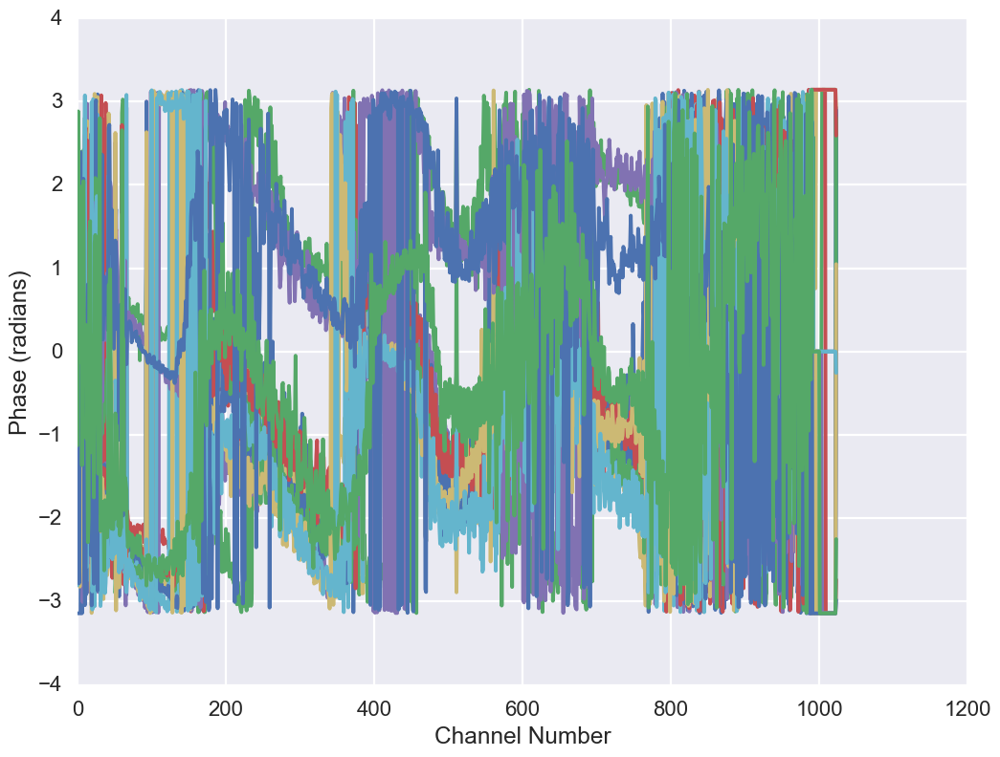

In [15]:
p.figure(figsize=(12,9))
for i,k in enumerate(fdata.keys()):
    p.plot(np.angle(fdata[k][pol][10]))
    p.ylabel('Phase (radians)')
    p.xlabel('Channel Number')

Here we are looking at the before and after calibration using the firstcal median solutions from above. Looks like baselines mostly line up, but there are some outliers. Baselines involving antenna 43 and 81 have $\pi$ phase shift. Going back, we saw this with antenna 43 on 2457458 as well. Becuse of this phase shift, I removed solving for offsets in firstcal because we saw that phase shift even if we solved for the offsets. Could this be due to degeneracies in the matrix equations? 

$\textbf{NOTE}$: This is due a rotation of the feed by 180$^{\circ}$. 

Taking the plot one step further we now want to look at the ratios between the all of the redundant baselines (shown below). This is actually what shows that there is a $\pi$ phase shift in antennas 43 and 81. If we account for that, we get very close to zero phase between all of the redundant baseline ratios. 

5 3


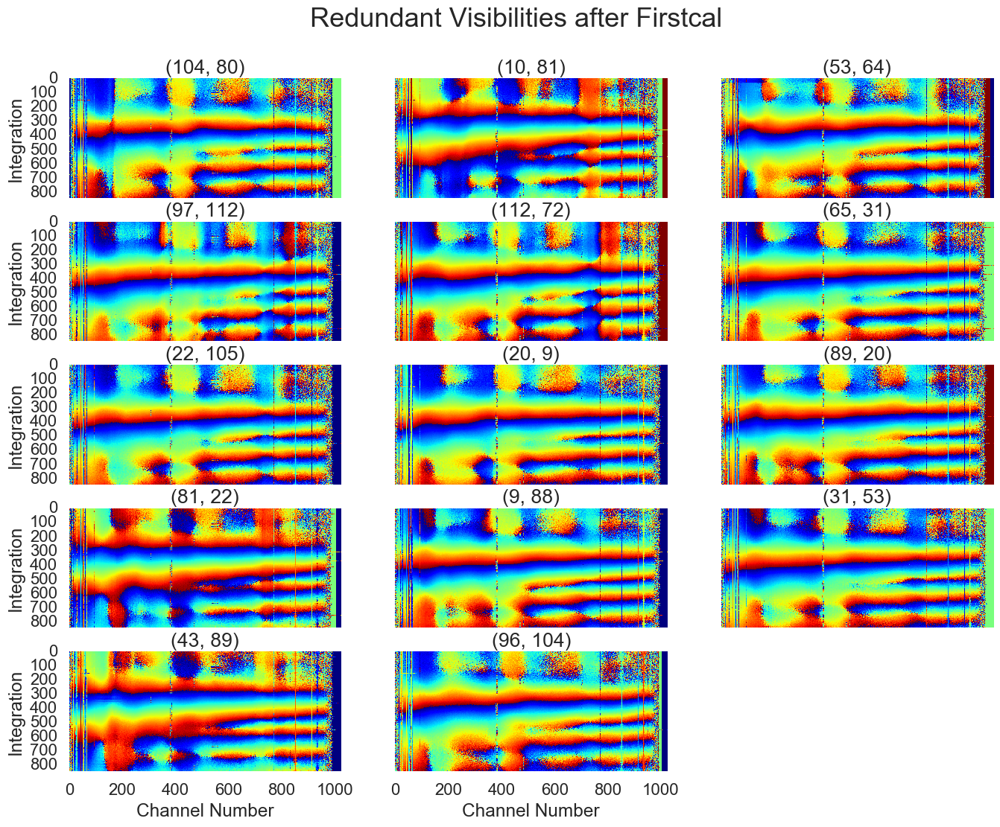

In [18]:
%matplotlib inline
nbls = len(pdata.keys())
r = int(divmod(nbls,3)[0] + np.ceil(divmod(nbls,3)[1]/3.))
c = 3
print r, c
p.figure(figsize=(16,12))
for i,k in enumerate(pdata.keys()):
    ax = p.subplot(r,c,i+1)
    #capo.plot.waterfall(np.vstack((pdata[k][pol],fdata[k][pol])), mode='phs', cmap='jet')
    p.title(str(k))
    p.grid(0)
    capo.plot.waterfall(fdata[k][pol], mode='phs', cmap='jet')
    if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
    if divmod(i,c)[0] != r-1:  ax.xaxis.set_visible(False)
    p.xlabel('Channel Number')
    p.ylabel('Integration')
    p.suptitle('Redundant Visibilities after Firstcal', fontsize=26)

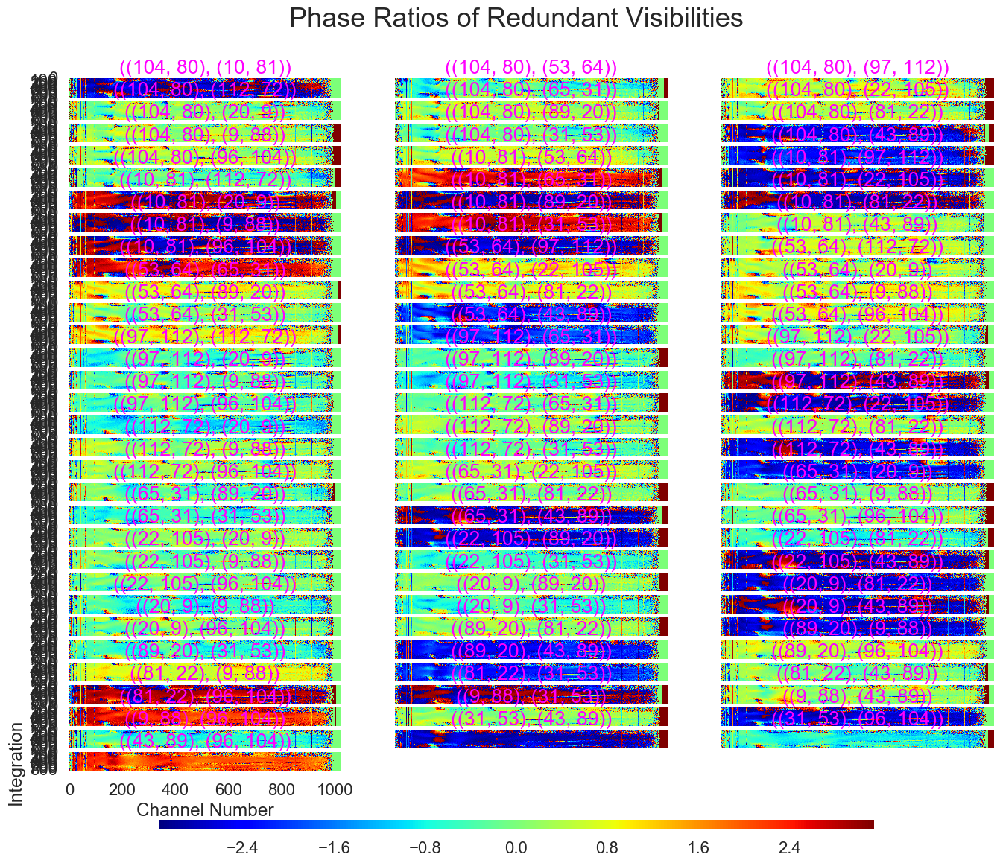

In [20]:
nratios = (nbls * (nbls-1))/2
r = int(divmod(nratios,3)[0] + np.ceil(divmod(nratios,3)[1]/3.))
c = 3
ncross = []
bls = pdata.keys()
for k in range(nbls): 
    for i in range(k+1,nbls): 
        ncross.append((bls[k],bls[i]))

fig = p.figure(figsize=(16,12))
for i,k in enumerate(ncross):
    ax = p.subplot(r,c,i+1)
    p.title(str(k),color='magenta')
    g = 1.0
#    if k[-1]==(81,112):
#        g*=np.exp(1j*-1*np.pi)
#    if k[0]==(81,112):
#        g*=np.exp(1j*1*np.pi)
#    if k[0]==(43,10): 
#        g*= np.exp(1j*1*np.pi)
#    if k[0]==(10,43):
#        print 'print conjugating'
#        capo.plot.waterfall(np.conj(fdata[k[0]][pol])*np.conj(fdata[k[-1]][pol])*g, mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)
    capo.plot.waterfall(fdata[k[0]][pol]*np.conj(fdata[k[-1]][pol])*g, mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)    
    p.grid(0)
    if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
    if divmod(i,c)[0] != r-1: ax.xaxis.set_visible(False)
p.xlabel('Channel Number')
p.ylabel('Integration')
p.suptitle('Phase Ratios of Redundant Visibilities', fontsize=26)

cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

The ratios of redundant visibilities above show that there is a $\pi$ phase shift for antennas 43x and 81x. This also means that the y polarizations would have the same shift due to symmetries. We need to rotate the two feeds or apply a phase shift for those two antennas in post processing. 

Below is some code that adds a $\pi$ phase shift to the two antennas. 

In [23]:
do = {}
for ant in medians.keys():
    ant = ant[1:]
    if int(ant)==81: off = -1j*np.pi
    elif int(ant)==43: off = -1j*np.pi
    else: off = 0.0
    do[int(ant)] = (medians['d'+ant], off)

fqs = np.linspace(.1,.2,1024)
###REWRITE 2457663.5* firstcal solutions###
for f in glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.5*xx.HH.uvc.median.fc.npz'):
    fname = '.'.join(f.split('.')[:-3] + ['median'])
    print fname
    capo.omni.save_gains_fc(do,fqs,'x',fname,verbose=False)
    

/Users/sherlock/projects/hera/data/2457663/zen.2457663.50098.xx.HH.uvc.median
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.50098.xx.HH.uvc.median.fc.npz
/Users/sherlock/projects/hera/data/2457663/zen.2457663.50794.xx.HH.uvc.median
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.50794.xx.HH.uvc.median.fc.npz
/Users/sherlock/projects/hera/data/2457663/zen.2457663.51490.xx.HH.uvc.median
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.51490.xx.HH.uvc.median.fc.npz
/Users/sherlock/projects/hera/data/2457663/zen.2457663.52186.xx.HH.uvc.median
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.52186.xx.HH.uvc.median.fc.npz
/Users/sherlock/projects/hera/data/2457663/zen.2457663.52882.xx.HH.uvc.median
Saving fcgains to /Users/sherlock/projects/hera/data/2457663/zen.2457663.52882.xx.HH.uvc.median.fc.npz
/Users/sherlock/projects/hera/data/2457663/zen.2457663.53578.xx.HH.uvc.median
Saving fcgains to

In [26]:
!cd ../2457663 ; rm -rf zen.2457663.5*xx.HH*.uvcF; ~/src/capo/omni/omni_apply.py  -p xx --omnipath="%s.HH.uvc.median.fc.npz" zen.2457663.5*xx.HH*.uvc --firstcal

   Omnical npz: zen.2457663.50098.xx.HH.uvc.median.fc.npz
Reading zen.2457663.50098.xx.HH.uvc
    Calibrating
    Saving zen.2457663.50098.xx.HH.uvcF
   Omnical npz: zen.2457663.50794.xx.HH.uvc.median.fc.npz
Reading zen.2457663.50794.xx.HH.uvc
    Calibrating
    Saving zen.2457663.50794.xx.HH.uvcF
   Omnical npz: zen.2457663.51490.xx.HH.uvc.median.fc.npz
Reading zen.2457663.51490.xx.HH.uvc
    Calibrating
    Saving zen.2457663.51490.xx.HH.uvcF
   Omnical npz: zen.2457663.52186.xx.HH.uvc.median.fc.npz
Reading zen.2457663.52186.xx.HH.uvc
    Calibrating
    Saving zen.2457663.52186.xx.HH.uvcF
   Omnical npz: zen.2457663.52882.xx.HH.uvc.median.fc.npz
Reading zen.2457663.52882.xx.HH.uvc
    Calibrating
    Saving zen.2457663.52882.xx.HH.uvcF
   Omnical npz: zen.2457663.53578.xx.HH.uvc.median.fc.npz
Reading zen.2457663.53578.xx.HH.uvc
    Calibrating
    Saving zen.2457663.53578.xx.HH.uvcF
   Omnical npz: zen.2457663.54274.xx.HH.uvc.median.fc.npz
Reading zen.2457663.54274.xx.HH.uvc
    Ca

In [27]:
#reinialize the firstcal data.
fmeta, fdata, fflags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.5*HH*.uvcF'), antstr, pol)
fdata = order_data(fdata,info)

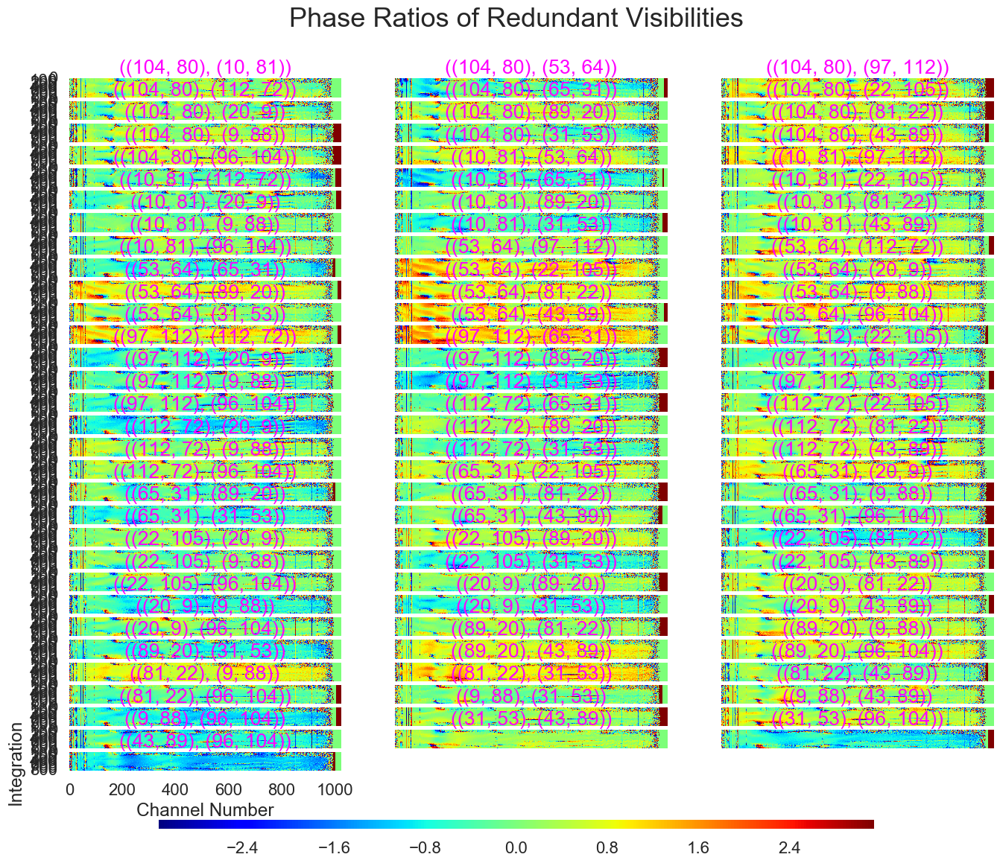

In [28]:
nratios = (nbls * (nbls-1))/2
r = int(divmod(nratios,3)[0] + np.ceil(divmod(nratios,3)[1]/3.))
c = 3
ncross = []
bls = pdata.keys()
for k in range(nbls): 
    for i in range(k+1,nbls): 
        ncross.append((bls[k],bls[i]))

fig = p.figure(figsize=(16,12))
for i,k in enumerate(ncross):
    ax = p.subplot(r,c,i+1)
    p.title(str(k),color='magenta')
    g = 1.0
#    if k[-1]==(81,112):
#        g*=np.exp(1j*-1*np.pi)
#    if k[0]==(81,112):
#        g*=np.exp(1j*1*np.pi)
#    if k[0]==(43,10): 
#        g*= np.exp(1j*1*np.pi)
#    if k[0]==(10,43):
#        print 'print conjugating'
#        capo.plot.waterfall(np.conj(fdata[k[0]][pol])*np.conj(fdata[k[-1]][pol])*g, mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)
    capo.plot.waterfall(fdata[k[0]][pol]*np.conj(fdata[k[-1]][pol])*g, mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)    
    p.grid(0)
    if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
    if divmod(i,c)[0] != r-1: ax.xaxis.set_visible(False)
p.xlabel('Channel Number')
p.ylabel('Integration')
p.suptitle('Phase Ratios of Redundant Visibilities', fontsize=26)

cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

## Looking at omnical'd data

Now we run omnical on the data using the firstcal solutions as an initial guess of the solutions. Below are the commands for running omnical. 

In [37]:
!cd ../2457663; for ff in `ls -d zen.2457663.5*xx.HH.uvc`; do echo ${ff}; ~/src/capo/omni/omni_run.py -p xx -C hsa7458_v000  --fc2=${ff}.median.fc.npz ${ff}; done

zen.2457663.50098.xx.HH.uvc
Reading zen.2457663.50098.xx.HH.uvc.median.fc.npz
96
64
81
97
104
9
10
43
112
80
72
20
53
22
105
88
89
65
31
Getting reds from calfile
Reading:
   zen.2457663.50098.xx.HH.uvc
   Logcal-ing
   Lincal-ing
   Saving zen.2457663.50098.xx.npz
zen.2457663.50794.xx.HH.uvc
Reading zen.2457663.50794.xx.HH.uvc.median.fc.npz
96
64
81
97
104
9
10
43
112
80
72
20
53
22
105
88
89
65
31
Getting reds from calfile
Reading:
   zen.2457663.50794.xx.HH.uvc
   Logcal-ing
   Lincal-ing
   Saving zen.2457663.50794.xx.npz
zen.2457663.51490.xx.HH.uvc
Reading zen.2457663.51490.xx.HH.uvc.median.fc.npz
96
64
81
97
104
9
10
43
112
80
72
20
53
22
105
88
89
65
31
Getting reds from calfile
Reading:
   zen.2457663.51490.xx.HH.uvc
   Logcal-ing
   Lincal-ing
   Saving zen.2457663.51490.xx.npz
zen.2457663.52186.xx.HH.uvc
Reading zen.2457663.52186.xx.HH.uvc.median.fc.npz
96
64
81
97
104
9
10
43
112
80
72
20
53
22
105
88
89
65
31
Getting reds from calfile
Reading:
   zen.2457663.52186.xx.HH.uvc

In [39]:
!cd ../2457663; ~/src/capo/omni/omni_apply.py  -p xx --omnipath="%s.npz" zen.2457663.5*xx.HH*.uvc 

   Omnical npz: zen.2457663.50098.xx.npz
Reading zen.2457663.50098.xx.HH.uvc
    Calibrating
    Saving zen.2457663.50098.xx.HH.uvcO
   Omnical npz: zen.2457663.50794.xx.npz
Reading zen.2457663.50794.xx.HH.uvc
    Calibrating
    Saving zen.2457663.50794.xx.HH.uvcO
   Omnical npz: zen.2457663.51490.xx.npz
Reading zen.2457663.51490.xx.HH.uvc
    Calibrating
    Saving zen.2457663.51490.xx.HH.uvcO
   Omnical npz: zen.2457663.52186.xx.npz
Reading zen.2457663.52186.xx.HH.uvc
    Calibrating
    Saving zen.2457663.52186.xx.HH.uvcO
   Omnical npz: zen.2457663.52882.xx.npz
Reading zen.2457663.52882.xx.HH.uvc
    Calibrating
    Saving zen.2457663.52882.xx.HH.uvcO
   Omnical npz: zen.2457663.53578.xx.npz
Reading zen.2457663.53578.xx.HH.uvc
    Calibrating
    Saving zen.2457663.53578.xx.HH.uvcO
   Omnical npz: zen.2457663.54274.xx.npz
Reading zen.2457663.54274.xx.HH.uvc
    Calibrating
    Saving zen.2457663.54274.xx.HH.uvcO
   Omnical npz: zen.2457663.54970.xx.npz
Reading zen.2457663.54970.xx

In [40]:
meta, data, flags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.5*.uvcO'), antstr, pol)
data = order_data(data,info)

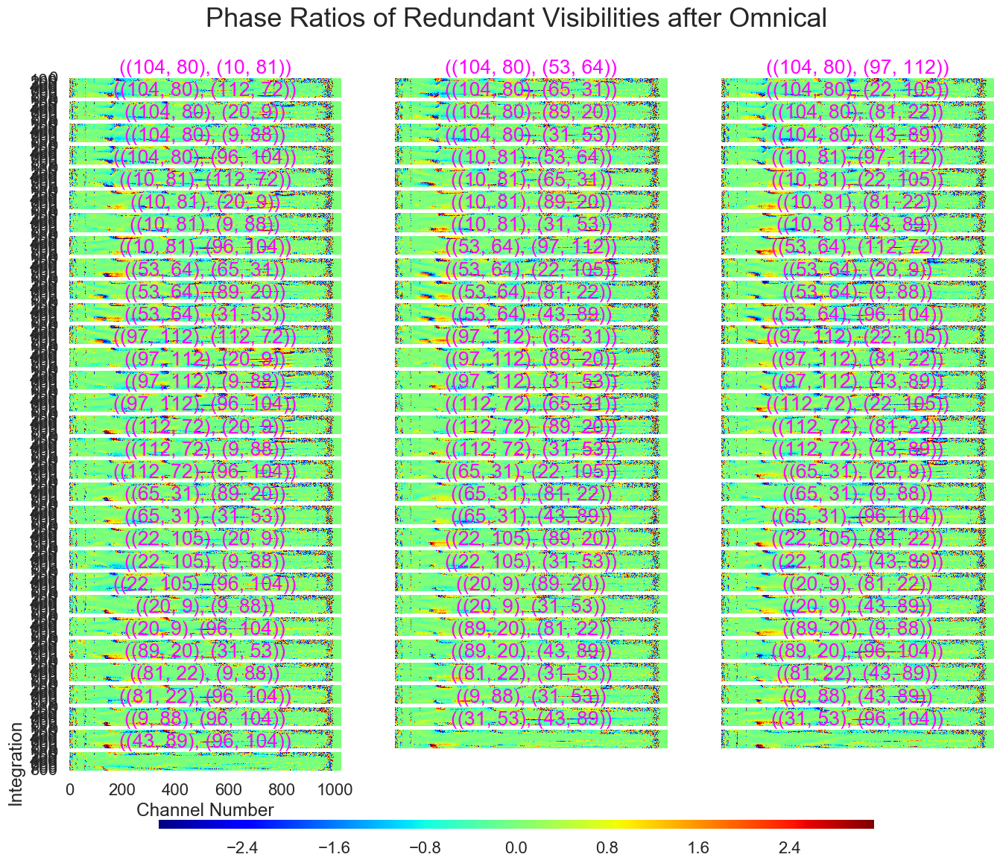

In [41]:
nratios = (nbls * (nbls-1))/2
r = int(divmod(nratios,3)[0] + np.ceil(divmod(nratios,3)[1]/3.))
c = 3
ncross = []
bls = data.keys()
for k in range(nbls): 
    for i in range(k+1,nbls): 
        ncross.append((bls[k],bls[i]))

fig = p.figure(figsize=(16,12))
for i,k in enumerate(ncross):
    ax = p.subplot(r,c,i+1)
    p.title(str(k),color='magenta')
    g = 1.0
#    if k[-1]==(81,112):
#        g*=np.exp(1j*-1*np.pi)
#    if k[0]==(81,112):
#        g*=np.exp(1j*1*np.pi)
#    if k[0]==(43,10): 
#        g*= np.exp(1j*1*np.pi)
#    if k[0]==(10,43):
#        print 'print conjugating'
#        capo.plot.waterfall(np.conj(fdata[k[0]][pol])*np.conj(fdata[k[-1]][pol])*g, mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)
    capo.plot.waterfall(data[k[0]][pol]*np.conj(data[k[-1]][pol])*g, mode='phs', cmap='jet', mx=np.pi, drng=2*np.pi)    
    p.grid(0)
    if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
    if divmod(i,c)[0] != r-1: ax.xaxis.set_visible(False)
p.xlabel('Channel Number')
p.ylabel('Integration')
p.suptitle('Phase Ratios of Redundant Visibilities after Omnical', fontsize=26)

cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

By looking at all the ratios of visibilites above, we see that redundant baslines are pretty redundant with one another after omnical. 

Since the visibilites are now omnicaled, lets take a look at how well all of the redundant baselines are calibrated to one another. This calls for an omniview plot! Below is some code that creates that and further is some code that loops through the file and makes a gif of the omniview plots. You will need to modify the markdown box to see the gifs (annoying to have them running all the time).


In [53]:
def omni_view(reds, vis, pol, int=10, chan=500, norm=False, save = None):
    points = []
    sym = []
    col = []
    bl = []
    ngps = len(reds)
    if save:
        p.clf()
        p.cla()
    for i,gp in enumerate(reds):
        c = colors[i%len(colors)]
        s = symbols[i/len(colors)]
        for r in gp:
            try:
                points.append(vis[r][pol][int,chan])
                bl.append(r)
            except(KeyError):
                points.append(np.conj(vis[r[::-1]][pol][int,chan]))
                bl.append(r[::-1])
            sym.append(s)
            col.append(c)
    points = np.array(points)
    max_x=0
    max_y=0
    for i,pt in enumerate(points):
        if norm:
            p.scatter(pt.real/np.abs(pt), pt.imag/np.abs(pt), c=col[i], marker=sym[i], s=50, label='{}'.format(bl[i]))
        else:        
            p.scatter(pt.real, pt.imag, c=col[i], marker=sym[i], s=50, label='{}'.format(bl[i]))
            if np.abs(pt.real) > max_x: max_x = np.abs(pt.real)
            if np.abs(pt.imag) > max_y: max_y = np.abs(pt.imag)
            
    if norm:         
        p.xlim(-1,1)
        p.ylim(-1,1)
    else: 
        p.xlim(-max_x-.1*max_x,max_x+.1*max_x)
        p.ylim(-max_y-.1*max_y,max_y+.1*max_y)
    p.ylabel('imag(V)')
    p.xlabel('real(V)')
    from mpldatacursor import datacursor
    datacursor(formatter='{label}'.format)
    if save:
        p.savefig(save)
    return None

def omni_view_gif(filenames, name='omni_movie.gif'):
    '''Give it a full path for images and all the images you want to use in order to use. list format.'''
    import imageio
    images = []
    for filename in filenames:
        images.append(imageio.imread(filename))
        imageio.mimsave(name, images)
    

In [43]:
#antstr = ','.join(antstrs)
antstr = 'cross'
#antstr = '9_88,22_105,31_53,43_89,53_64,96_104'#,97_112,20_9,89_20,65_31,112_72,104_80'
pol='xx'
view_meta, view_data, view_flags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.50098.xx.HH.uvc'), antstr, pol,verbose=False)
view_meta_fcal, view_data_fcal, view_flags_ocal = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.50098.xx.HH.uvcF'), antstr, pol)
view_meta_ocal, view_data_ocal, view_flags_ocal = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.50098.xx.HH.uvcO'), antstr, pol)
view_data = order_data(view_data,info)
view_data_fcal = order_data(view_data_fcal,info)
view_data_ocal = order_data(view_data_ocal,info)

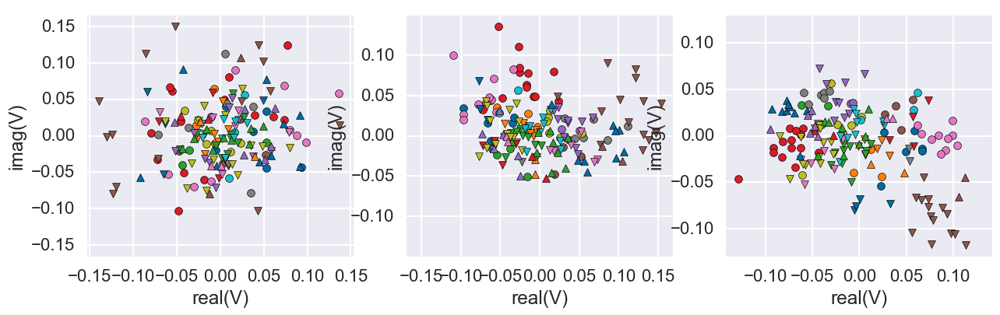

In [54]:
%matplotlib inline
p.figure(1, figsize=(15,4))
p.subplot(131)
omni_view(info.get_reds(), view_data, pol, chan=425, norm=False)
p.subplot(132)
omni_view(info.get_reds(), view_data_fcal, pol, chan=425, norm=False)
p.subplot(133)
omni_view(info.get_reds(), view_data_ocal, pol, chan=425, norm=False)

## Omnical Solutions

In [31]:
m,g,v,x = omni.from_npz(glob.glob('/Users/sherlock/projects/hera/data/2457663/zen.2457663.5*.xx.npz'))

5 4


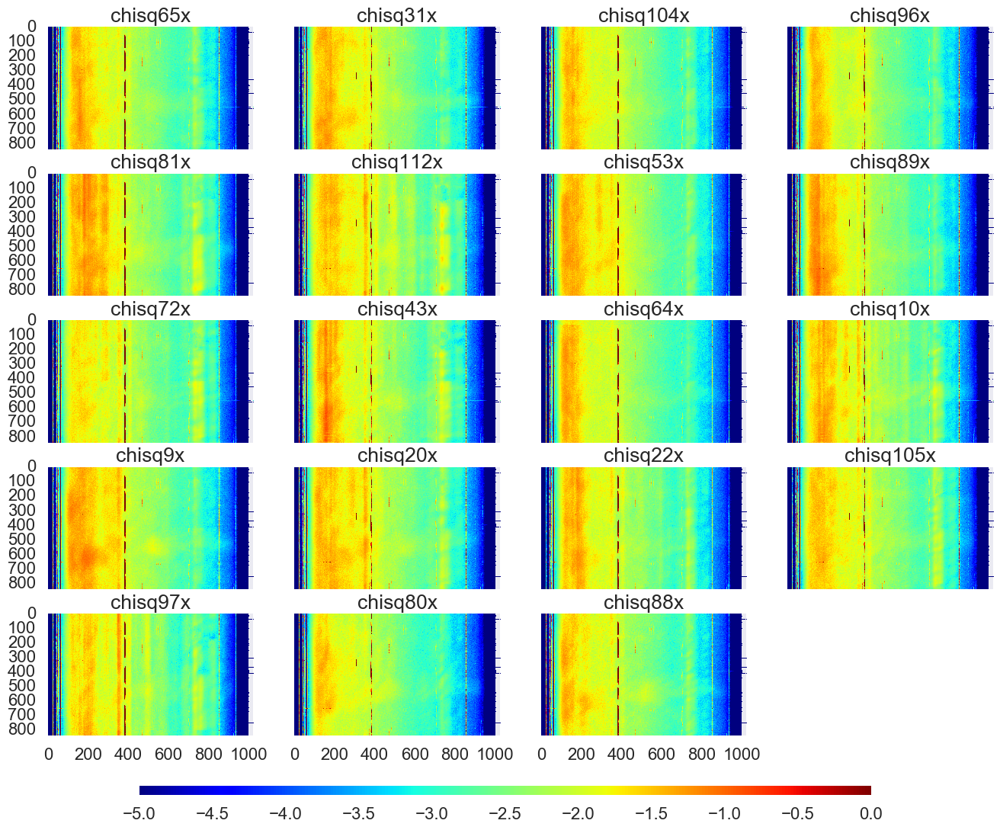

In [33]:
nants = 19
r = 5
c = 4
print r, c
fig = p.figure(figsize=(16,12))

i = 0
for k in m.keys():
    if k.startswith('c') and k.endswith('x'):
        ax = p.subplot(r,c,i+1)
        p.title(k)
        p.grid(0)
        capo.plot.waterfall(m[k], mx =0, drng = 5, cmap='jet')
        if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
        if divmod(i,c)[0] != r-1: ax.xaxis.set_visible(False)
        i+=1
        
cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')

Plotted above are the chisquares per antenna from omnical. There is no noise model, i.e. the noise is flat, so this is a measure of the error in the fits. 

Lets look at the gain solutions.

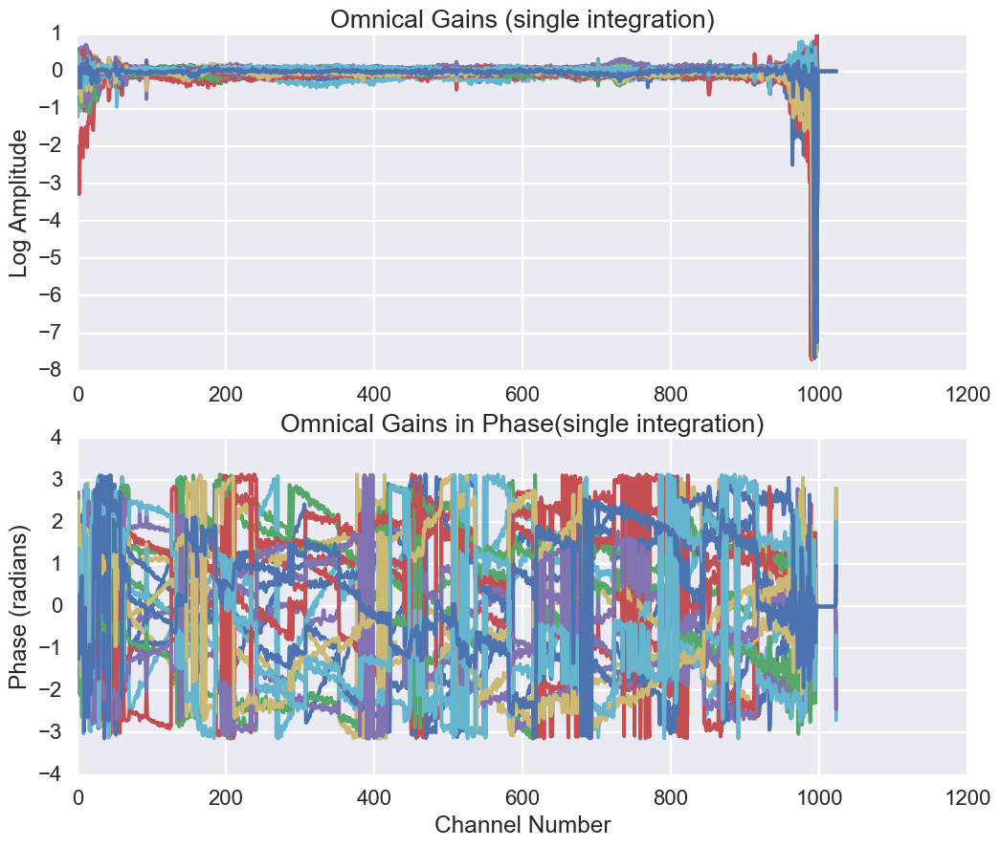

In [34]:
p.figure(figsize=(12,10))
for ant in g['x'].keys():
    p.subplot(211)
    p.plot(np.log10(np.abs(g['x'][ant][10])),label=str(ant))
    p.title('Omnical Gains (single integration)')
    p.ylabel('Log Amplitude')
    p.subplot(212)
    p.title('Omnical Gains in Phase(single integration)')
    p.xlabel('Channel Number')
    p.ylabel('Phase (radians)')
    p.plot(np.angle(g['x'][ant][10]),label=str(ant))

In [35]:
#pick some random baselines
bls = []
for k in info.get_reds():
    bls+=k
bls = np.array(bls)
plot_these = bls[np.random.randint(0,len(bls),5)]

#get the mappings of visibilities to the stored mdl-visibilities in the 
redmapping = {}
for k in v['xx'].keys():
    for gp in info.get_reds():
        if k in gp:
            for kk in gp : redmapping[kk] = k
#get the baselines in string format.                
s = ''
for k in plot_these:
    s += str(k[0])+'_'+str(k[1])+','
s = s[:-1]
pol='xx'

In [36]:
meta, data, flags = capo.miriad.read_files(glob.glob('/Users/sherlock/projects/hera/data/2457458/zen.2457458.5*.uvAO'), s, pol)

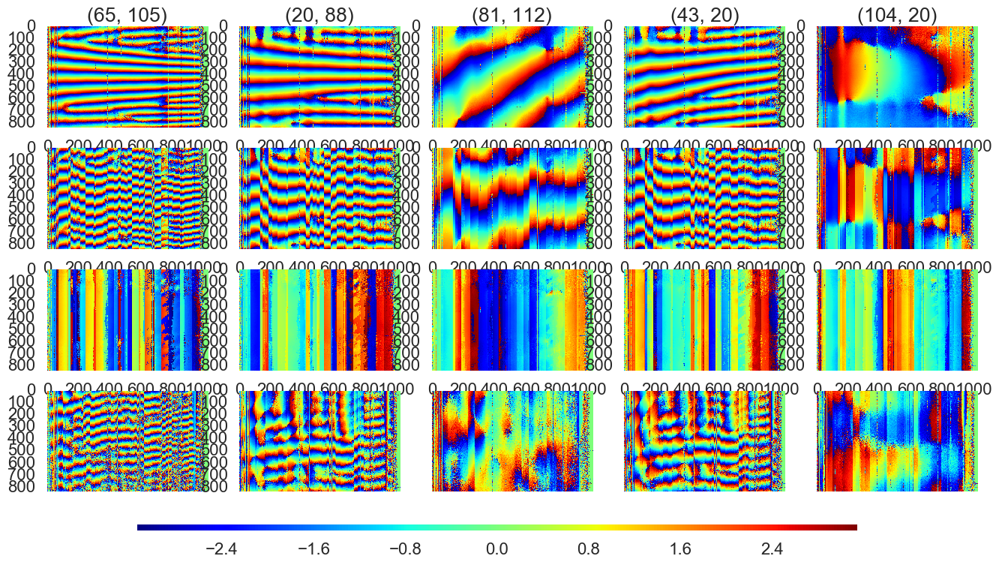

In [41]:
r = 4
c = 5

fig = p.figure(figsize=(16,8))

l = 0
for i,j in plot_these:
    ax = p.subplot(r,c,l+1)
    p.title(str((i,j)))
    mdlkey = redmapping[i,j]
    capo.plot.waterfall(g['x'][i]*np.conj(g['x'][j])*v['xx'][mdlkey], cmap='jet', mode='phs', mx=np.pi, drng=2*np.pi)
    p.grid(0)
    ax = p.subplot(r,c,l+1+c)
    capo.plot.waterfall(v['xx'][mdlkey], cmap='jet', mode='phs', mx=np.pi, drng=2*np.pi)
    p.grid(0)
    ax = p.subplot(r,c,l+1+2*c)
    capo.plot.waterfall(g['x'][i]*np.conj(g['x'][j]), cmap='jet', mode='phs', mx=np.pi, drng=2*np.pi)
    p.grid(0)
    ax = p.subplot(r,c,l+1+3*c)
    if (i,j) in data.keys():
        capo.plot.waterfall(data[i,j]['xx'], cmap='jet', mode='phs')
    else:
        capo.plot.waterfall(data[j,i]['xx'], cmap='jet', mode='phs')
    if divmod(i,c)[-1] != 0:  ax.yaxis.set_visible(False) 
    if divmod(i,c)[0] != r-1: ax.xaxis.set_visible(False)
    p.grid(0)
    l+=1
        
cax = fig.add_axes([0.2, 0.06, 0.6, 0.01])
p.colorbar(cax=cax, orientation='horizontal')